# A preview of `starry v1.0`

Let's fit an eclipsing binary light curve.

<div style="background-color: #ffb0b0; border-left: 15px solid #ff6969;">
    <h2 style="line-height:2.5em; margin-left:1em;">Warning</h2>
    <p style="line-height:3em; margin-top:-1em; margin-left:1.75em;">
        These are pre-release notes, so everything is still subject to change! Please submit a <a href="https://github.com/rodluger/starry/issues">GitHub issue</a> if you have any suggestions.
    </p>
</div>

In [ ]:
!pip install

In [1]:
%matplotlib inline

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pymc3 as pm
import exoplanet as xo
import starry
import theano
import theano.tensor as tt
np.random.seed(12)

## Generate two maps

The first is that of an unspotted solar-like star with quadratic limb darkening.

In [3]:
A = starry.Map(udeg=2)
A[1] = 0.40
A[2] = 0.25
A.r = 1.0
A.L = 1.0
A.show(theta=np.linspace(0, 360, 50))

Compiling `render`... Done.


The second is that of an M dwarf with a large mid-latitude spot. It rotates with a period of 0.11 days and is inclined at 60 degrees with respect to the line of sight. In this notebook, we will attempt to infer the map of this star.

In [35]:
B = starry.Map(ydeg=5)
B.inc = 60
B.add_spot(amp=-0.2, lat=30, lon=60)
B_true_map = B[1:, :].eval()
B.P = 0.11
B.t0 = 0.0
B.r = 0.4
B.L = 0.1
B.show(theta=np.linspace(0, 360, 50))

Compiling `render`... Done.


Even with occultations, there are significant degeneracies in the mapping problem, so we need a good prior. Let's assume we know the power spectrum of the star, which is the sum of the squares of the spherical harmonic coefficients at each degree.

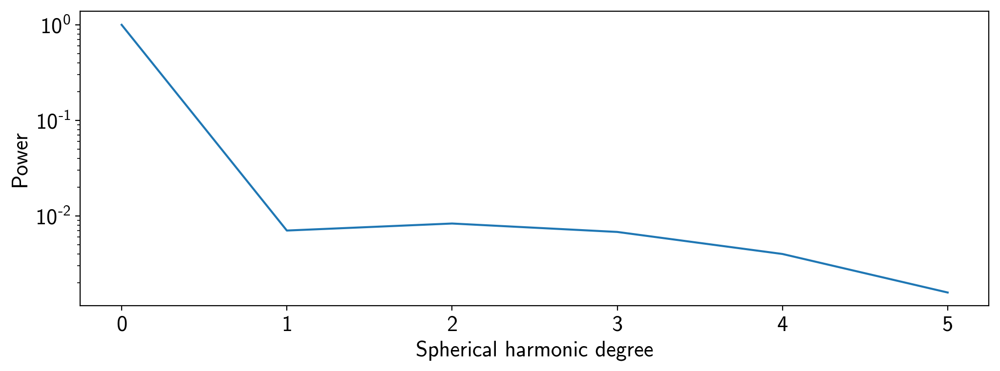

In [5]:
plt.plot([np.sum(B[l,:].eval() ** 2) for l in range(B.ydeg + 1)])
plt.yscale("log")
plt.xlabel("Spherical harmonic degree")
plt.ylabel("Power");

The power is roughly flat at $10^{-2}$ for $l>0$, so that will be the **variance** on the Gaussian prior on the spherical harmonic coefficients.

## Generate a light curve

Let's generate a synthetic light curve over one day. Here I'm assuming an orbital period of 0.3 days for the binary and an inclination of 89 degrees with respect to the line of sight (the axis of rotation of B is therefore quite misaligned with the orbital angular momentum vector).

Note that I need to specify *two* orbit instances, one for each star. That's because *exoplanet* currently only supports simple Keplerian orbits with a single star, so we need to do a little hacking. Note the different values of `r_star` and the offset in the values of `t0`.

In [6]:
t = np.linspace(-0.5, 0.5, 10000)
orbit_A = xo.orbits.KeplerianOrbit(period=0.3, a=10.0, t0=0.0, incl=89*np.pi/180., r_star=B.r)
flux_A = A.flux(orbit=orbit_A, t=t).eval()
orbit_B = xo.orbits.KeplerianOrbit(period=0.3, a=10.0, t0=0.15, incl=89*np.pi/180., r_star=A.r)
flux_B = B.flux(orbit=orbit_B, t=t).eval()

# The observed flux is the sum
flux_true = flux_A + flux_B

# Add noise
sigma = 0.001
flux = flux_true + sigma * np.random.randn(len(t))

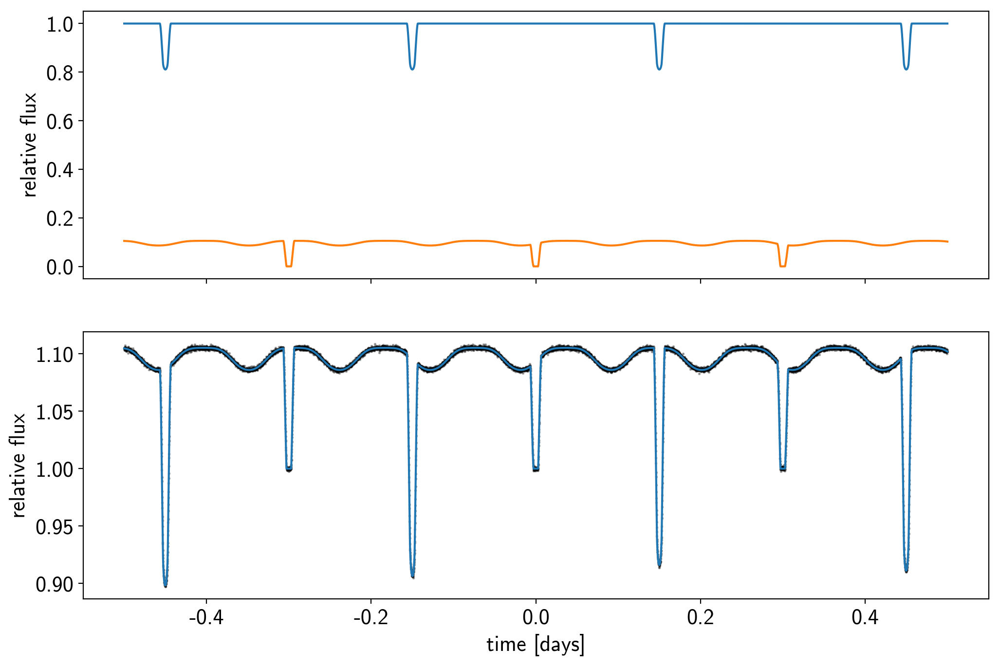

In [7]:
fig, ax = plt.subplots(2, sharex=True, figsize=(12, 8))
ax[0].plot(t, flux_A)
ax[0].plot(t, flux_B)
ax[0].set_ylabel("relative flux")
ax[1].plot(t, flux, 'k.', alpha=0.3, ms=2)
ax[1].plot(t, flux_true)
ax[1].set_xlabel("time [days]")
ax[1].set_ylabel("relative flux");

## Let's define the `pymc3` model

**IMPORTANT**: We need to re-define the `A` and `B` instances below to avoid confusing `theano`.

In [8]:
with pm.Model() as model:

    # Everything we assume we know
    A = starry.Map(udeg=2)
    A[1] = 0.40
    A[2] = 0.25
    A.r = 1.0
    A.L = 1.0
    B = starry.Map(ydeg=5)
    B.inc = 60
    B.P = 0.11
    B.t0 = 0.0
    B.r = 0.4
    B.L = 0.1
    orbit_A = xo.orbits.KeplerianOrbit(period=0.3, a=10.0, t0=0.0, incl=89*np.pi/180., r_star=B.r)
    orbit_B = xo.orbits.KeplerianOrbit(period=0.3, a=10.0, t0=0.15, incl=89*np.pi/180., r_star=A.r)
    
    # The Ylm coefficients with a simple gaussian prior
    ncoeff = B.Ny - 1
    mu = np.zeros(ncoeff)
    cov = 1e-2 * np.eye(ncoeff)
    Ylm = pm.MvNormal("Ylm", mu, cov, shape=(ncoeff,))
    B[1:, :] = Ylm
    
    # Compute the flux
    flux_A = A.flux(orbit=orbit_A, t=t)
    flux_B = B.flux(orbit=orbit_B, t=t)
    flux_model = flux_A + flux_B
    
    # Track some values for plotting later
    pm.Deterministic("flux_model", flux_model)

    # Save our initial guess
    flux_model_guess = xo.eval_in_model(flux_model)

    # The likelihood function assuming known Gaussian uncertainty
    pm.Normal("obs", mu=flux_model, sd=sigma, observed=flux)

Run a quick gradient descent to find the MAP solution:

In [9]:
with model:
    map_soln = xo.optimize()

optimizing logp for variables: ['Ylm']
message: Optimization terminated successfully.
logp: -224840.1872689637 -> 55004.713169709656


Plot the model:

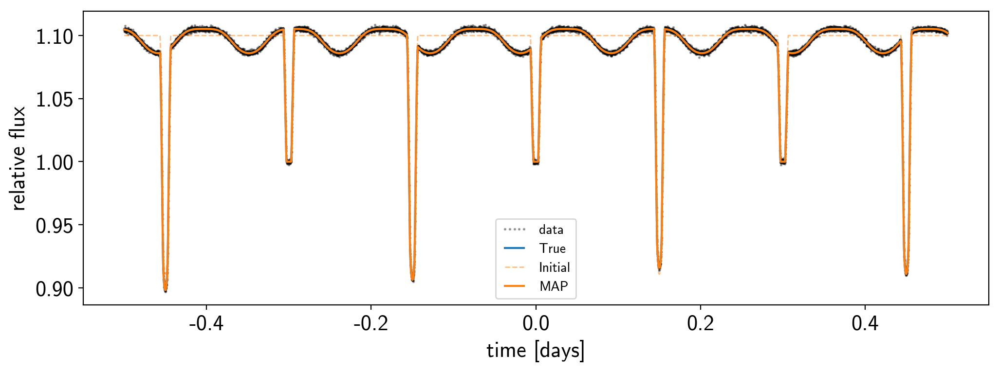

In [10]:
plt.plot(t, flux, 'k.', alpha=0.3, ms=2, label="data")
plt.plot(t, flux_true, "C0-", label="True")
plt.plot(t, flux_model_guess, "C1--", lw=1, alpha=0.5, label="Initial")
plt.plot(t, xo.eval_in_model(flux_model, map_soln, model=model), "C1-", label="MAP")
plt.legend(fontsize=10, numpoints=5)
plt.xlabel("time [days]")
plt.ylabel("relative flux");

Plot the corresponding map for `B`: note that we recover the spot!

In [11]:
B_test = starry.Map(ydeg=5)
B_test.inc = 60
B_test[1:, :] = map_soln['Ylm']
B_test.show(theta=np.linspace(0, 360, 50))

Compiling `render`... Done.


## NUTS sampling

Let's run the NUTS sampler to get posteriors on the map of `B`.

In [12]:
sampler = xo.PyMC3Sampler(window=100, finish=200, cores=1)
with model:
    burnin = sampler.tune(tune=2000, start=map_soln, step_kwargs=dict(target_accept=0.9))
    trace = sampler.sample(draws=2000)

100%|██████████| 202/202 [00:09<00:00, 21.14it/s]
Sequential sampling (2 chains in 1 job)
NUTS: [Ylm]
100%|██████████| 2000/2000 [01:55<00:00, 17.38it/s]


Things appear to have converged well:

In [16]:
varnames = ["Ylm"]
pm.summary(trace, varnames=varnames)

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
Ylm__0,-0.013355,0.010824,0.000116,-0.035198,0.007354,8281.107835,0.999789
Ylm__1,-0.055370,0.018497,0.000205,-0.091787,-0.018746,7675.127224,0.999752
Ylm__2,-0.071822,0.021935,0.000272,-0.113713,-0.028519,6309.606253,0.999839
Ylm__3,-0.005799,0.040172,0.000497,-0.080739,0.074266,6280.927869,0.999830
Ylm__4,0.006382,0.035706,0.000432,-0.058888,0.081890,6526.933317,0.999753
Ylm__5,-0.000953,0.035217,0.000386,-0.071133,0.065970,8140.285581,0.999751
Ylm__6,-0.067737,0.024381,0.000311,-0.113901,-0.018003,6277.672208,0.999863
Ylm__7,-0.053081,0.030263,0.000385,-0.112549,0.005131,5780.012860,0.999767
Ylm__8,-0.005956,0.039573,0.000517,-0.086543,0.071258,5659.409250,0.999759
Ylm__9,-0.029087,0.042095,0.000503,-0.114969,0.049812,6653.171729,0.999855


Display the corner plot for a few of the dimensions. Note the strong degeneracies that are still present.

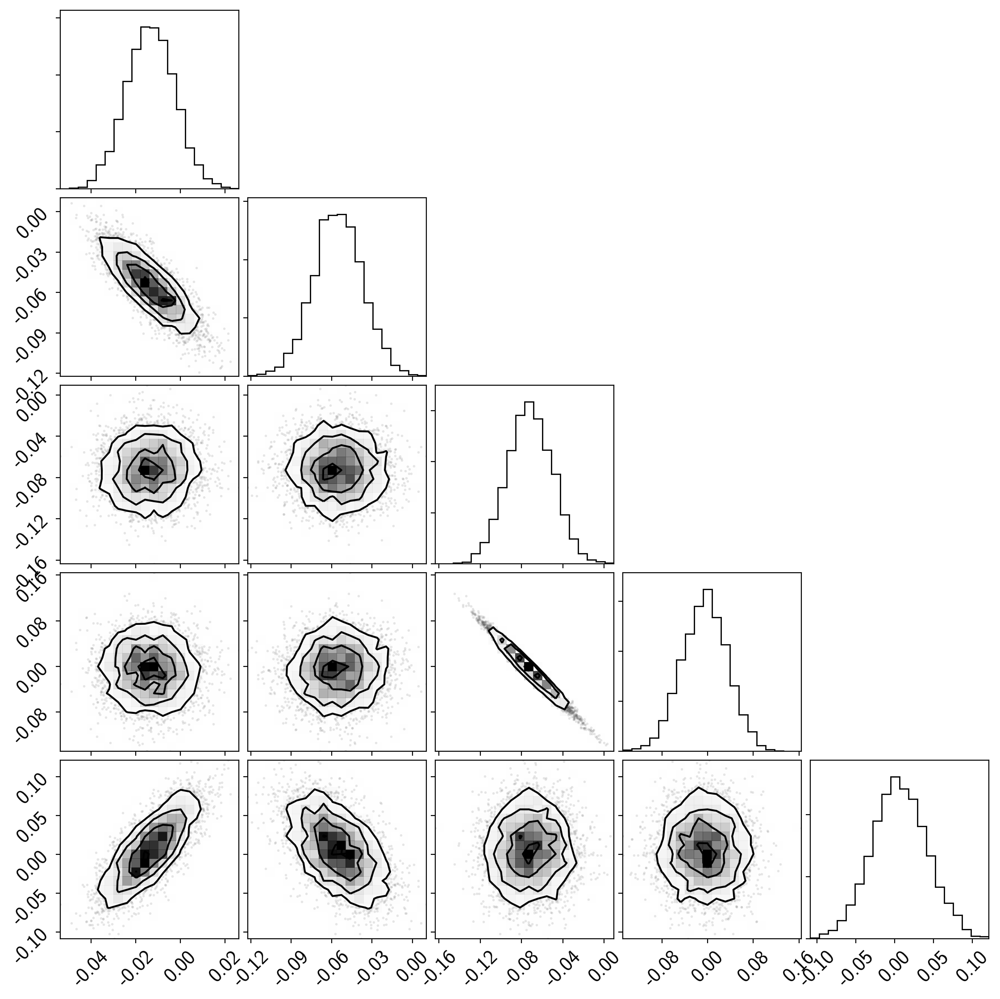

In [23]:
import corner
samples = pm.trace_to_dataframe(trace, varnames=varnames)
corner.corner(np.array(samples)[:, :5]);

Plot the model for 24 random samples:

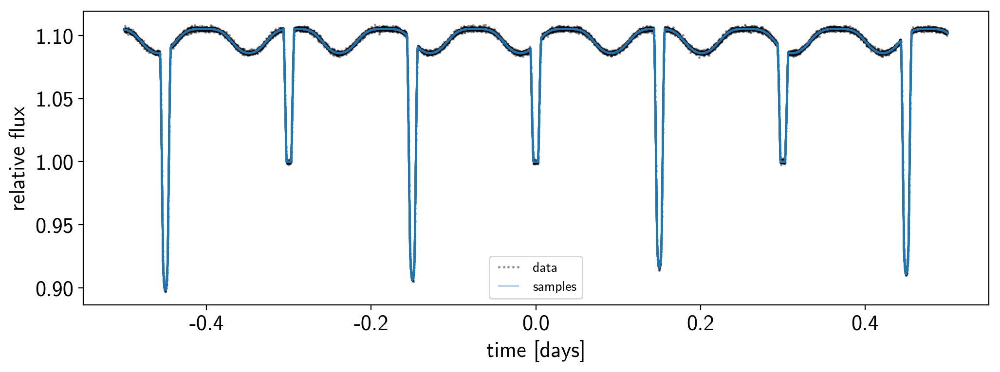

In [18]:
plt.plot(t, flux, 'k.', alpha=0.3, ms=2, label="data")
label = "samples"
for i in np.random.choice(range(len(trace["flux_model"])), 24):
    plt.plot(t, trace["flux_model"][i], "C0-", alpha=0.3, label=label)
    label = None
plt.legend(fontsize=10, numpoints=5)
plt.xlabel("time [days]")
plt.ylabel("relative flux");

Finally, display the true map next to several random samples:

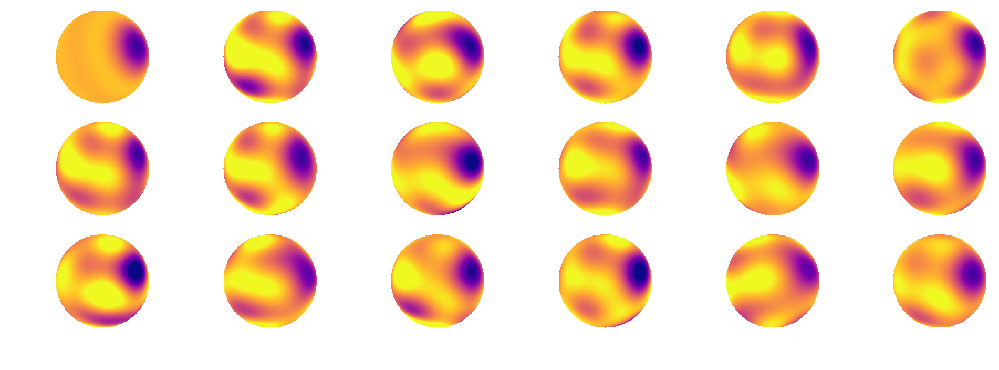

In [46]:
vmin=0
vmax=0.4
nsamp = len(trace["Ylm"])
coeffs = [B_true_map] + [trace["Ylm"][np.random.randint(nsamp)] for i in range(17)]
fig, ax = plt.subplots(3, 6, figsize=(12, 4))
ax = ax.flatten()
for i, coeff in enumerate(coeffs):
    B_test[1:, :] = coeff
    img = B_test.render().eval()[0]
    ax[i].imshow(img, origin="lower", vmin=vmin, vmax=vmax, cmap="plasma")
    ax[i].axis('off')